<a href="https://colab.research.google.com/github/APURVSAXENA/Diabetes-/blob/main/Diabetes_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


import all the required libraries

In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import f1_score
from sklearn.metrics import  confusion_matrix

In [ ]:
#import lifelines
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
from sklearn import model_selection
from sklearn.utils import class_weight
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
import plotly.express as px
from sklearn.decomposition import PCA
from collections import defaultdict
from sklearn.metrics.pairwise import euclidean_distances
#from lifelines import KaplanMeierFitter as KM
#from lifelines.statistics import logrank_test
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors
from random import sample
from pandas import DataFrame
from numpy import random

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
DataPath='/content/drive/MyDrive/hmf data/diabetes_project_dataset.csv'

In [ ]:
#read the data from CSV file
Data = pd.read_csv(DataPath)

# New Section

# New Section

In [ ]:
#show the statistical summary of data
Data.describe()

,SampleID,existing_diabetes,incident_diabetes,diabetes_time,age,male,BMI,HDL,LDL,trig,SBP,DBP,hypertension,fasting,fasting_glucose,fasting_insulin,HbA1c,current_smoker,ex_smoker,exercise,healthy_vegetables,junk_food,total_fiber,mtb_1368087,mtb_1380093,mtb_1812369,mtb_1838668,mtb_1042362,mtb_1091716,mtb_1228672,mtb_1542487,mtb_1272352,mtb_1391826,mtb_1435571,mtb_1521753,mtb_1834574,mtb_1050860,mtb_606773,mtb_638620,mtb_752773,...,mtb_2124874,mtb_2124876,mtb_2125022,mtb_2125072,mtb_2125261,mtb_2125276,mtb_2125431,mtb_2125593,mtb_2125601,mtb_2125919,mtb_2126385,mtb_2126559,mtb_2126569,mtb_2126600,mtb_2126936,mtb_2126937,mtb_2127038,mtb_2127059,mtb_2127078,mtb_2127092,mtb_2127172,mtb_2127305,mtb_2127364,mtb_2127543,mtb_2127755,mtb_2127787,mtb_2127791,mtb_2127998,mtb_2128301,mtb_2128425,mtb_2129028,mtb_2129035,mtb_2129040,mtb_2129060,mtb_2129124,mtb_2129133,mtb_2129210,mtb_2129554,mtb_2129677,mtb_2129684
count,8291.000000,8148.000000,8148.000000,7979.000000,8291.000000,8291.000000,8287.000000,8291.000000,8274.000000,8291.000000,8287.000000,8287.000000,8148.000000,8270.000000,3571.000000,3571.000000,4715.000000,8249.000000,8291.000000,8163.000000,8095.000000,8134.000000,7819.000000,8291.000000,8291.000000,8291.000000,8290.000000,8291.000000,8291.000000,8291.000000,8291.000000,8291.000000,8291.000000,8291.000000,8291.000000,8291.000000,8291.000000,8291.000000,8291.000000,8291.000000,...,1566.000000,2647.000000,6796.000000,5729.000000,8283.000000,2098.000000,5803.000000,1273.000000,5315.000000,900.000000,246.000000,7328.000000,2652.000000,1101.000000,2305.000000,434.000000,2208.000000,696.000000,1615.000000,777.000000,2143.000000,1116.000000,206.000000,8080.000000,7620.000000,6202.000000,1810.000000,180.000000,774.000000,5479.000000,6232.000000,5023.000000,3152.000000,2269.000000,583.000000,3278.000000,2229.000000,866.000000,461.000000,286.000000
mean,4146.000000,0.055351,0.086402,12.959853,48.053552,0.468098,26.918973,1.501256,3.350247,1.439755,135.090322,79.018583,0.262150,5.827932,5.961221,9.563008,36.933828,0.259183,0.217585,2.014088,10.749969,8.260143,31.927996,11.366149,13.088239,10.088098,8.318617,15.406949,16.858951,10.517433,11.109090,18.820442,13.045659,9.691146,13.738067,7.671010,22.641927,22.681316,13.349224,31.594448,...,13.641879,7.512466,9.023058,9.552910,19.363329,15.341603,9.606660,9.587946,7.844181,21.069586,3.732932,5.571599,9.386408,6.565306,33.382501,8.827043,9.496403,6.942838,6.146441,8.749450,5.927119,6.270995,3.020153,5.566650,8.282391,10.113949,10.894667,5.243559,5.704606,10.505059,16.295505,7.986198,5.912593,4.425526,14.436640,3.456775,4.826330,38.019850,6.572024,6.311371
std,2393.549874,0.228678,0.280973,5.229209,13.156909,0.499011,4.671872,0.416626,0.899027,1.031507,20.014215,11.334539,0.439831,3.090370,1.163252,13.726985,6.958196,0.438213,0.412629,0.702795,3.429150,3.010812,6.204996,1.628000,1.534006,1.714380,1.714859,1.844332,1.593874,1.667071,1.596767,1.549694,1.532873,1.538171,1.710433,1.538685,1.918691,1.918679,1.565923,2.135811,...,2.606569,2.545023,1.951992,2.409453,12.856586,44.675307,2.301147,3.065112,2.251769,2.417619,2.494604,1.921666,2.756632,1.635969,2.802916,2.409593,3.386881,2.742299,2.841390,3.423514,2.858068,4.047343,2.157373,1.661545,2.212015,1.862643,2.315341,2.222954,3.148761,2.980271,1.909589,1.972445,1.832767,2.262010,2.745022,2.269981,2.624069,2.545487,8.151164,12.730121
min,1.000000,0.000000,0.000000,-37.510000,24.000000,0.000000,15.836757,0.310000,0.770000,0.270000,89.000000,39.000000,0.000000,0.000000,4.070000,0.800000,20.000000,0.000000,0.000000,1.000000,3.000000,5.000000,9.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000

In [ ]:
# information of data
Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8291 entries, 0 to 8290
Columns: 60207 entries, SampleID to mtb_2129684
dtypes: float64(60203), int64(4)
memory usage: 3.7 GB


In [ ]:
#size of data
Data.shape

(8291, 60207)

In [ ]:
#sample of data
Data.head()

Removed subjects with existing diabetes for this analysis.

In [ ]:
#{1}Selecting rows where existing diabetes is not there
# select the data which has value 0 for existing_diabetes
data = Data.loc[Data["existing_diabetes"] == 0.0]

In [ ]:
data.shape

(7697, 60207)

In [ ]:
data.isnull().sum()

SampleID                0
existing_diabetes       0
incident_diabetes       0
diabetes_time           0
age                     0
                     ... 
mtb_2129133          4661
mtb_2129210          5626
mtb_2129554          6901
mtb_2129677          7264
mtb_2129684          7428
Length: 60207, dtype: int64

In [ ]:
#find the percent of missing data 
percent_missing = data.isnull().sum() * 100 / len(data)
percent_missing

SampleID              0.000000
existing_diabetes     0.000000
incident_diabetes     0.000000
diabetes_time         0.000000
age                   0.000000
                       ...    
mtb_2129133          60.556061
mtb_2129210          73.093413
mtb_2129554          89.658308
mtb_2129677          94.374432
mtb_2129684          96.505132
Length: 60207, dtype: float64

In [ ]:
#check the features which has missing data precent is greater than 20
percent_missing[percent_missing>20.0]

fasting_glucose    57.437963
fasting_insulin    57.437963
HbA1c              43.497467
mtb_18238          56.268676
mtb_18262          43.679356
                     ...    
mtb_2129133        60.556061
mtb_2129210        73.093413
mtb_2129554        89.658308
mtb_2129677        94.374432
mtb_2129684        96.505132
Length: 42083, dtype: float64

In [ ]:
#a function to calculate the null values
'''
  desc: get nulls for each column in counts & percentages
  arg: dataframe
  return: dataframe
  '''

def null_analysis(df):
  
  null_cnt = df.isnull().sum() # calculate null counts
  null_cnt = null_cnt[null_cnt!=0] # remove non-null cols
  null_percent = null_cnt / len(df) * 100 # calculate null percentages
  null_table = pd.concat([pd.DataFrame(null_cnt), pd.DataFrame(null_percent)], axis=1)
  null_table.columns = ['counts', 'percentage']
  null_table.sort_values('counts', ascending=False, inplace=True)
  return null_table


#visualise null table
import plotly.express as px
null_table = null_analysis(data)
px.bar(null_table.reset_index(), x='index', y='percentage', text='counts', height=500)

In [ ]:
# a function to drop the value after a threshold
'''
  desc: delete columns based on a null percentage threshold
  arg: df=dataframe; threshold=percentage of nulls in column
  return: dataframe
  '''

def null_threshold(df, threshold=0):
  
  null_table = null_analysis(df)
  null_table = null_table[null_table['percentage']>=0]
  df.drop(null_table.index, axis=1, inplace = True)
  return df

In [ ]:
#select the data after the null value analysis
data1 = null_threshold(data)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
data1.shape

(7697, 1987)

In [ ]:
#from sklearn.impute import SimpleImputer

#imp_mean = SimpleImputer(missing_values=np.nan, strategy='median', copy=False)
#imp_mean.fit(data1)
# output is in numpy, so convert to df
#data2 = pd.DataFrame(imp_mean.transform(data1),columns=data1.columns)
data2=data1

In [ ]:
data2.head()

,SampleID,existing_diabetes,incident_diabetes,diabetes_time,age,male,HDL,trig,hypertension,ex_smoker,mtb_1368087,mtb_1380093,mtb_1812369,mtb_1042362,mtb_1091716,mtb_1228672,mtb_1542487,mtb_1272352,mtb_1391826,mtb_1435571,mtb_1521753,mtb_1834574,mtb_1050860,mtb_606773,mtb_638620,mtb_752773,mtb_590255,mtb_709794,mtb_352255,mtb_509192,mtb_1230298,mtb_841524,mtb_1957718,mtb_18385,mtb_18386,mtb_18440,mtb_18712,mtb_18911,mtb_19013,mtb_19108,...,mtb_1888866,mtb_1888919,mtb_1890558,mtb_1890752,mtb_1895320,mtb_1897069,mtb_1898223,mtb_1898298,mtb_1900047,mtb_1901939,mtb_1902527,mtb_1908191,mtb_1911986,mtb_1913620,mtb_1913630,mtb_1913635,mtb_1914931,mtb_1915009,mtb_1916062,mtb_1916768,mtb_1916814,mtb_1916826,mtb_1919790,mtb_1919959,mtb_1921559,mtb_1924325,mtb_1924466,mtb_1924523,mtb_1930164,mtb_1933753,mtb_1933760,mtb_1936126,mtb_1936261,mtb_1945649,mtb_1955392,mtb_1958012,mtb_1965438,mtb_1965524,mtb_1973875,mtb_1975912
1,2,0.0,0.0,14.82,69,0,1.60,1.85,0.0,0,12.523948,12.396497,8.915601,15.870070,19.927809,11.281649,13.025576,19.707109,13.068911,9.878442,13.175717,6.628580,23.001835,22.663677,16.092091,32.842780,25.215257,15.909792,13.316935,14.594176,12.938364,12.524154,4.902424,7.541808,23.467964,7.605545,6.656409,8.944526,9.353625,6.367916,...,2.774582,7.290025,4.882248,2.556239,4.865163,3.132432,5.421454,2.846499,5.821040,3.083861,3.965563,5.430886,1.967629,7.816770,1.891990,1.330663,3.201234,1.989223,3.214477,7.553806,7.929681,7.109227,9.883257,6.063939,5.081071,9.431742,10.515040,6.430849,3.802726,2.558451,4.887156,1.391869,1.340333,2.155204,2.356520,4.233126,4.521447,3.791331,2.677205,2.758938
2,3,0.0,0.0,14.82,72,1,1.55,1.12,1.0,0,9.891712,10.823469,8.935202,13.763427,14.078740,9.379045,9.098672,17.783300,11.628487,7.408712,12.876340,6.722477,23.632577,20.834489,10.957421,30.440446,22.090017,13.495890,16.517088,17.804685,12.506579,15.638863,4.902578,7.863958,3.258734,7.981496,1.423451,7.336432,11.099619,5.433801,...,5.086166,4.415240,6.356659,4.087190,7.047395,5.388843,6.881280,5.020764,5.676591,5.254810,4.477903,4.064142,3.613139,7.926630,2.800629,2.335443,4.964301,4.736552,4.492517,6.672564,6.117956,4.835701,8.106617,4.194519,6.861101,8.296330,8.408848,5.069001,6.161384,4.314980,5.225085,2.465189,3.549965,3.019719,2.319567,2.927152,3.396235,4.083240,2.698918,2.107410
3,4,0.0,1.0,2.20,68,0,1.20,2.33,0.0,0,13.192851,13.231676,9.492927,20.835545,15.902070,8.607652,12.304895,19.097035,14.864097,8.813503,14.029214,7.987217,28.004500,23.900195,16.622800,30.224667,24.068957,11.018594,14.770869,16.506993,9.386408,13.064268,5.418974,7.800853,3.273118,7.945692,1.523729,7.185382,8.077563,5.184345,...,1.366022,7.348978,4.647867,1.975957,3.646242,2.707228,5.300486,2.152101,3.866721,2.858026,2.338899,5.976532,1.672005,9.571867,1.412538,0.631822,2.712266,1.665268,1.876786,2.965266,2.751457,2.851306,5.201868,1.947345,4.093016,5.480201,5.317384,1.791882,4.219640,1.717873,3.831657,0.973773,0.945411,1.661746,1.310343,6.644341,2.004868,3.287110,2.448782,2.695815
4,5,0.0,0.0,14.82,60,0,1.70,1.29,0.0,0,11.095172,12.697999,10.401415,16.343100,16.567852,12.855010,10.810644,19.652111,13.417355,10.779993,16.110594,5.791803,23.175487,23.143605,12.069803,31.646249,26.044937,12.934877,13.945308,16.996647,13.202727,16.219149,6.628916,7.040719,13.672678,7.693295,5.989749,7.619927,7.272229,6.261581,...,2.339244,7.011510,4.320340,2.309992,7.520200,3.127799,6.432738,2.730684,4.334187,3.133015,4.863973,3.927109,2.433139,9.312253,2.437513,2.816993,3.585980,2.291547,4.424066,5.332291,4.041260,4.490705,7.217052,3.904152,5.552912,8.491743,9.539871,4.328423,4.717011,3.913711,4.916811,1.966965,2.542115,2.765256,3.024894,3.523464,3.008694,4.968565,4.587871,4.868754
5,6,0.0,0.0,14.82,25,1,1.25,0.84,0.0,1,12.471219,13.826380,9.346159,14.950927,19.539529,11.168741,12.688300,20.984306,14.511696,13.441844,16.321428,7.150654,25.183549,23.133310,13.824913,33.044804,26.548276,14.134530,15.931769,16.760706,15.467259,16.766432,7.879138,3.917389,26.386894,9.512433,5.834656,6.8636

In [ ]:
#drop the column incident_diabetes and exisitng_diabetes from the dataset which make the data for logistic regression

X=data2.drop(columns=['incident_diabetes', 'existing_diabetes'])

In [ ]:
# make incident_diabetes as a target variable in logistic regression
y=data2['incident_diabetes']

In [ ]:
#a correlation function which gives the correlation values among the features

def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [ ]:
# select those features which has correlation value is equal or greater than 0.9
corr_features = correlation(X, 0.9)
len(set(corr_features))

542

In [ ]:
#drop the selected correlation features from the dataset
X= X.drop(corr_features,axis=1)

In [ ]:
X.shape

(7697, 1443)

In [ ]:
#normalize the dataset
X2=(X-X.mean())/X.std()

In [ ]:
X2.shape


(7697, 1443)

In [ ]:
#X2=X2[1:]
len(X2)

7697

In [ ]:
y2=y

Statsmodels is a Python module that provides various functions for estimating different statistical models and performing statistical tests  


Investigated each individual features and biomarkers and use p-values to justify your findings.

In [ ]:
import statsmodels.api as sm 

# to get intercept -- this is optional
#X_train = sm.add_constant(X_train)

# get response variables

# fit the model with maximum likelihood function
model = sm.Logit(y, X2).fit()
# output message
print(model.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.



Optimization terminated successfully.
         Current function value: 0.568782
         Iterations 7
                           Logit Regression Results                           
Dep. Variable:      incident_diabetes   No. Observations:                 7697
Model:                          Logit   Df Residuals:                     6254
Method:                           MLE   Df Model:                         1442
Date:                Mon, 10 Jan 2022   Pseudo R-squ.:                 -0.8593
Time:                        07:47:26   Log-Likelihood:                -4377.9
converged:                       True   LL-Null:                       -2354.6
Covariance Type:            nonrobust   LLR p-value:                     1.000
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
SampleID         -0.0039      0.032     -0.122      0.903      -0.066       0.059
diabetes_time    -1.

In [ ]:
# a dataframe which consist the values of coef, odds ratio, pvalue, name

coefs = pd.DataFrame({
    'coef': model.params.values,
    'odds ratio': np.exp(model.params.values),
    'pvalue': model.pvalues,
    'name': model.params.index
}).sort_values(by='pvalue', ascending=False)
coefs

,coef,odds ratio,pvalue,name
mtb_1444307,-0.000133,0.999867,9.990897e-01,mtb_1444307
mtb_723743,-0.000080,0.999920,9.990338e-01,mtb_723743
mtb_177694,0.000076,1.000076,9.985233e-01,mtb_177694
mtb_1697376,-0.000247,0.999753,9.982582e-01,mtb_1697376
mtb_1827281,0.000157,1.000157,9.978649e-01,mtb_1827281
...,...,...,...,...
male,-0.161925,0.850505,9.969220e-03,male
age,-0.162604,0.849928,5.565208e-03,age
mtb_1833492,-0.110632,0.895268,5.599864e-04,mtb_1833492
hypertension,0.193583,1.213590,1.021824e-08,hypertension


In [ ]:
#select those features which has pvalue less than 0.5

feature_cols = coefs[coefs.pvalue < 0.05].index
feature_cols

Index(['mtb_1596386', 'mtb_1215338', 'male', 'age', 'mtb_1833492',
       'hypertension', 'diabetes_time'],
      dtype='object')

In [ ]:
X3=X2[feature_cols]

In [ ]:
X3.shape

(7697, 7)

In [ ]:
cols= list(X3.columns)
cols

['mtb_1596386',
 'mtb_1215338',
 'male',
 'age',
 'mtb_1833492',
 'hypertension',
 'diabetes_time']

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



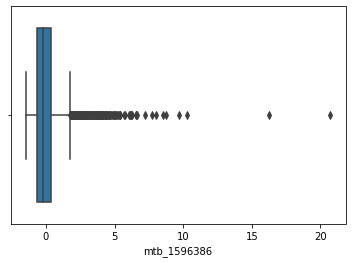

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



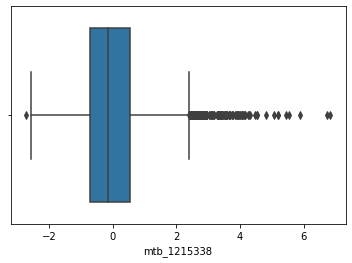

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



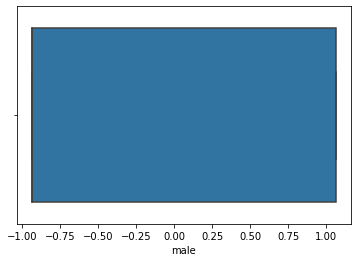

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



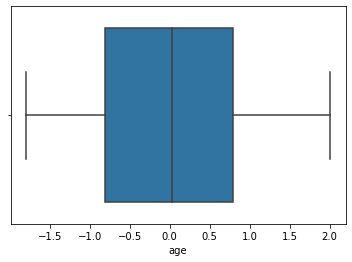

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



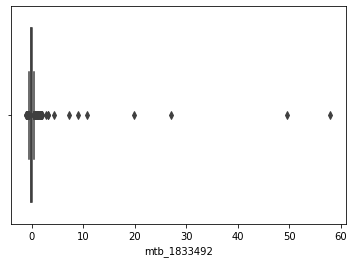

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



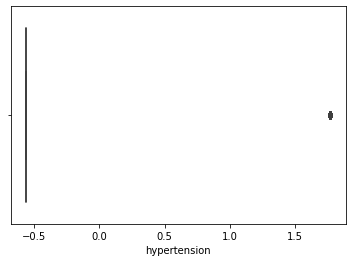

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



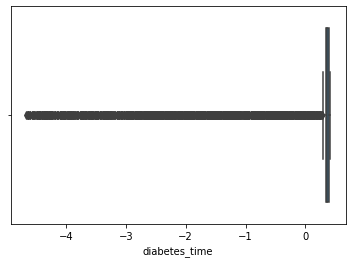

In [ ]:
import seaborn as sns
for i in cols:
  sns.boxplot(X3[i])
  plt.show()

By using Robust scaler, we can reduce the influence of outliers


In [ ]:
#from sklearn.preprocessing import power_transform
from sklearn.preprocessing import RobustScaler
transformer = RobustScaler().fit(X3)
transformer.transform(X3)
#print(power_transform(df))

array([[ 1.71666337e-01,  1.01610085e+00,  0.00000000e+00, ...,
         4.01024145e-01,  0.00000000e+00,  0.00000000e+00],
       [ 1.16608346e-01,  1.35462850e+00,  1.00000000e+00, ...,
        -2.01036082e-01,  2.33583388e+00,  0.00000000e+00],
       [-1.39478707e-01, -7.56799961e-01,  0.00000000e+00, ...,
        -1.19180618e-01,  0.00000000e+00, -1.05166667e+02],
       ...,
       [ 8.94716515e-01,  7.15742991e-01,  1.00000000e+00, ...,
         2.06267225e-02,  2.33583388e+00,  5.83333333e-01],
       [ 8.14106793e-01,  4.73268704e-01,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00,  5.83333333e-01],
       [-1.46391364e-01,  1.86830767e-01,  0.00000000e+00, ...,
         1.82427640e-02,  0.00000000e+00,  5.83333333e-01]])

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



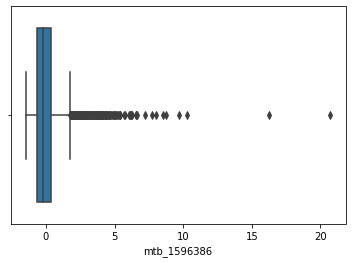

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



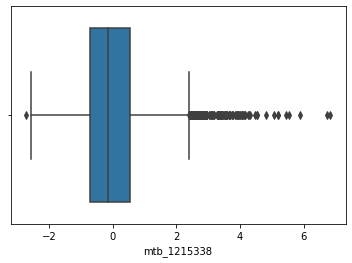

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



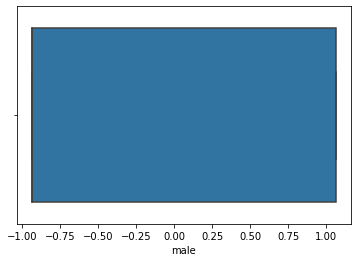

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



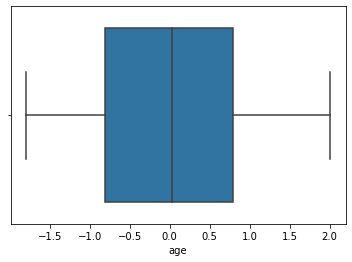

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



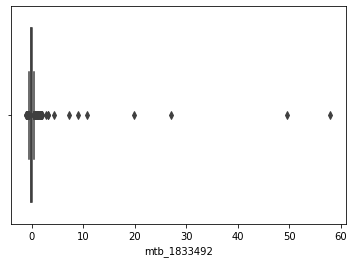

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



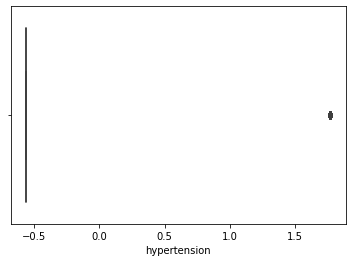

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



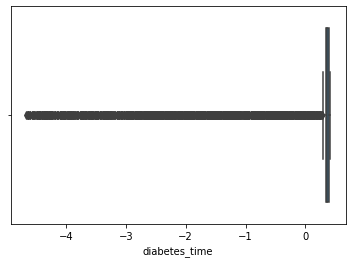

In [ ]:
cols1= list(X3.columns)
for i in cols1:
  sns.boxplot(X3[i])
  plt.show()

Our preprocessing has been done on the dataset. Now it is ready for Machine learning model so we can split the dataset into train and test.


In [ ]:
# separate dataset into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    X3,
    y,
    test_size=0.3,
    random_state=0)

X_train.shape, X_test.shape

((5387, 7), (2310, 7))

In [ ]:
X3.hist()

Tried survival analysis using Cox regressions utilizing the provided time-to-event information



In Kaplan-Meier, Nelson-Aalen, and Log-Rank Test we are only able to consider one variable at a time. In Kaplan-Meier, Nelson-Aalen, and Log-Rank Test, we can perform operations only on categorical variables like sex, status, etc., which are not generally used for non-categorical data like age, weight, etc. As a solution, we use the Cox proportional hazards regression analysis, which works for both quantitative predictor (non-categorical) variables and categorical variables.

The ultimate purpose of the Cox proportional hazard method is to notice how different factors in our dataset impact the event of interest.

In [ ]:
!pip install -q lifelines

     |████████████████████████████████| 348 kB 15.6 MB/s 
     |████████████████████████████████| 55 kB 4.7 MB/s 


In [ ]:
from lifelines import CoxPHFitter

In [ ]:
#counts, bins = np.histogram(data['mtb_1025737'])
#plt.hist(bins[:-1], bins, weights=counts)
#plt.xscale('log')
#counts, bins = np.histogram(np.log(data['mtb_1025737']+0.001))
#plt.hist(bins[:-1], bins, weights=counts)

In [ ]:
#data[data.columns[0:10]]

In [ ]:
df7=data1.drop(columns=['existing_diabetes'])

In [ ]:
cph = CoxPHFitter()
cph.fit(df7, duration_col='diabetes_time', event_col='incident_diabetes', show_progress=False)

/usr/local/lib/python3.7/dist-packages/lifelines/fitters/coxph_fitter.py:1602: ConvergenceWarning:

Newton-Rhaphson failed to converge sufficiently. Please see the following tips in the lifelines documentation: https://lifelines.readthedocs.io/en/latest/Examples.html#problems-with-convergence-in-the-cox-proportional-hazard-model



<lifelines.CoxPHFitter: fitted with 7697 total observations, 6993 right-censored observations>

The ``p_value_threshold`` is set at 0.05. Even under the null hypothesis of no violations, some
covariates will be below the threshold by chance. This is compounded when there are many covariates.
Similarly, when there are lots of observations, even minor deviances from the proportional hazard
assumption will be flagged.

With that in mind, it's best to use a combination of statistical tests and visual tests to determine
the most serious violations. Produce visual plots using ``check_assumptions(..., show_plots=True)``
and looking for non-constant lines. See link [A] below for a full example.



<lifelines.StatisticalResult: proportional_hazard_test>
 null_distribution = chi squared
degrees_of_freedom = 1
             model = <lifelines.CoxPHFitter: fitted with 7697 total observations, 6993 right-censored observations>
         test_name = proportional_hazard_test

---
                   test_statistic      p  -log2(p)
HDL          km              0.12   0.73      0.45
             rank            0.12   0.73      0.45
SampleID     km              1.19   0.28      1.86
             rank            1.15   0.28      1.82
age          km              0.08   0.78      0.36
             rank            0.08   0.77      0.37
ex_smoker    km              0.03   0.87      0.19
             rank            0.03   0.87      0.19
hypertension km              1.35   0.24      2.03
             rank            1.33   0.25      2.01
male         km              0.03   0.87      0.20
             rank            0.03   0.87      0.20
mtb_1002360  km              0.25   0.62      0.69
             rank            0.25   0.62      0.69
mtb_100380   km              0.73   0.39      1.35
             rank            0.75   0.39      1.37
mtb_1004967  km              0.08   0.78      0.36
             rank            0.07   0.79      0.35
mtb_1010274  km              0.74   0.39      1.36
             rank            0.73   0.39      1.35
mtb_1010719  km              2.25   0.13      2.91
             rank            2.31   0.13      2.96
mtb_1012080  km              0.51   0.48      1.07
             rank            0.53   0.46      1.11
mtb_1012396  km              1.84   0.17      2.52
             rank            1.80   0.18      2.48
mtb_1012446  km              0.56   0.45      1.14
             rank            0.57   0.45      1.15
mtb_1012449  km              0.60   0.44      1.19
             rank            0.61   0.43      1.20
mtb_1012999  km              3.07   0.08      3.65
             rank            3.10   0.08      3.68
mtb_1014171  km              0.21   0.65      0.63
             rank            0.20   0.66      0.61
mtb_1014990  km              1.61   0.20      2.29
             rank            1.65   0.20      2.33
mtb_1015061  km              0.30   0.58      0.78
             rank            0.30   0.59      0.77
mtb_1017751  km              0.03   0.85      0.23
             rank            0.04   0.85      0.23
mtb_1018646  km              0.15   0.70      0.52
             rank            0.15   0.70      0.52
mtb_1025238  km              0.37   0.54      0.88
             rank            0.37   0.54      0.88
mtb_1025247  km              0.12   0.72      0.46
             rank            0.12   0.73      0.46
mtb_102560   km              0.08   0.78      0.35
             rank            0.08   0.78      0.35
mtb_1025737  km              0.28   0.60      0.75
             rank            0.29   0.59      0.77
mtb_1028055  km              2.02   0.16      2.68
             rank            2.06   0.15      2.73
mtb_1028226  km              0.31   0.58      0.79
             rank            0.34   0.56      0.84
mtb_1028227  km              0.33   0.57      0.82
             rank            0.32   0.57      0.81
mtb_1028495  km              0.02   0.88      0.18
             rank            0.02   0.89      0.16
mtb_1030205  km              0.25   0.62      0.70
             rank            0.26   0.61      0.71
mtb_1032572  km              0.08   0.78      0.36
             rank            0.08   0.78      0.36
mtb_1033108  km              0.01   0.93      0.10
             rank            0.01   0.94      0.10
mtb_1033318  km              3.74   0.05      4.23
             rank            3.75   0.05      4.25
mtb_1038630  km              1.21   0.27      1.88
             rank            1.21   0.27      1.89
mtb_1040282  km              0.25   0.62      0.70
             rank            0.24   0.62      0.69
mtb_1041711  km              0.23   0.63      0.66
             rank            0.23   0.63      0.6



1. Variable 'trig' failed the non-proportional test: p-value is 0.0222.

   Advice 1: the functional form of the variable 'trig' might be incorrect. That is, there may be
non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'trig' using pd.cut, and then specify it in `strata=['trig',
...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...


2. Variable 'mtb_1050860' failed the non-proportional test: p-value is 0.0250.

   Advice 1: the functional form of the variable 'mtb_1050860' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in l

/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




22. Variable 'mtb_431747' failed the non-proportional test: p-value is 0.0473.

   Advice 1: the functional form of the variable 'mtb_431747' might be incorrect. That is, there may
be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_431747' using pd.cut, and then specify it in
`strata=['mtb_431747', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




23. Variable 'mtb_528286' failed the non-proportional test: p-value is 0.0426.

   Advice 1: the functional form of the variable 'mtb_528286' might be incorrect. That is, there may
be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_528286' using pd.cut, and then specify it in
`strata=['mtb_528286', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




24. Variable 'mtb_580570' failed the non-proportional test: p-value is 0.0003.

   Advice 1: the functional form of the variable 'mtb_580570' might be incorrect. That is, there may
be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_580570' using pd.cut, and then specify it in
`strata=['mtb_580570', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




25. Variable 'mtb_638523' failed the non-proportional test: p-value is 0.0414.

   Advice 1: the functional form of the variable 'mtb_638523' might be incorrect. That is, there may
be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_638523' using pd.cut, and then specify it in
`strata=['mtb_638523', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




26. Variable 'mtb_825561' failed the non-proportional test: p-value is 0.0122.

   Advice 1: the functional form of the variable 'mtb_825561' might be incorrect. That is, there may
be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_825561' using pd.cut, and then specify it in
`strata=['mtb_825561', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




27. Variable 'mtb_838132' failed the non-proportional test: p-value is 0.0091.

   Advice 1: the functional form of the variable 'mtb_838132' might be incorrect. That is, there may
be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_838132' using pd.cut, and then specify it in
`strata=['mtb_838132', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




28. Variable 'mtb_841776' failed the non-proportional test: p-value is 0.0504.

   Advice 1: the functional form of the variable 'mtb_841776' might be incorrect. That is, there may
be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_841776' using pd.cut, and then specify it in
`strata=['mtb_841776', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




29. Variable 'mtb_900158' failed the non-proportional test: p-value is 0.0018.

   Advice 1: the functional form of the variable 'mtb_900158' might be incorrect. That is, there may
be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_900158' using pd.cut, and then specify it in
`strata=['mtb_900158', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




30. Variable 'mtb_917804' failed the non-proportional test: p-value is 0.0530.

   Advice 1: the functional form of the variable 'mtb_917804' might be incorrect. That is, there may
be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_917804' using pd.cut, and then specify it in
`strata=['mtb_917804', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




31. Variable 'mtb_951583' failed the non-proportional test: p-value is 0.0378.

   Advice 1: the functional form of the variable 'mtb_951583' might be incorrect. That is, there may
be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_951583' using pd.cut, and then specify it in
`strata=['mtb_951583', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




32. Variable 'mtb_976071' failed the non-proportional test: p-value is 0.0385.

   Advice 1: the functional form of the variable 'mtb_976071' might be incorrect. That is, there may
be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_976071' using pd.cut, and then specify it in
`strata=['mtb_976071', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




33. Variable 'mtb_1033318' failed the non-proportional test: p-value is 0.0527.

   Advice 1: the functional form of the variable 'mtb_1033318' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1033318' using pd.cut, and then specify it in
`strata=['mtb_1033318', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




34. Variable 'mtb_1044058' failed the non-proportional test: p-value is 0.0242.

   Advice 1: the functional form of the variable 'mtb_1044058' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1044058' using pd.cut, and then specify it in
`strata=['mtb_1044058', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




35. Variable 'mtb_1052551' failed the non-proportional test: p-value is 0.0295.

   Advice 1: the functional form of the variable 'mtb_1052551' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1052551' using pd.cut, and then specify it in
`strata=['mtb_1052551', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




36. Variable 'mtb_1060293' failed the non-proportional test: p-value is 0.0474.

   Advice 1: the functional form of the variable 'mtb_1060293' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1060293' using pd.cut, and then specify it in
`strata=['mtb_1060293', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




37. Variable 'mtb_1062633' failed the non-proportional test: p-value is 0.0249.

   Advice 1: the functional form of the variable 'mtb_1062633' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1062633' using pd.cut, and then specify it in
`strata=['mtb_1062633', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




38. Variable 'mtb_1100106' failed the non-proportional test: p-value is 0.0168.

   Advice 1: the functional form of the variable 'mtb_1100106' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1100106' using pd.cut, and then specify it in
`strata=['mtb_1100106', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




39. Variable 'mtb_1114722' failed the non-proportional test: p-value is 0.0250.

   Advice 1: the functional form of the variable 'mtb_1114722' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1114722' using pd.cut, and then specify it in
`strata=['mtb_1114722', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




40. Variable 'mtb_1125004' failed the non-proportional test: p-value is 0.0362.

   Advice 1: the functional form of the variable 'mtb_1125004' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1125004' using pd.cut, and then specify it in
`strata=['mtb_1125004', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




41. Variable 'mtb_1139581' failed the non-proportional test: p-value is 0.0389.

   Advice 1: the functional form of the variable 'mtb_1139581' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1139581' using pd.cut, and then specify it in
`strata=['mtb_1139581', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




42. Variable 'mtb_1173200' failed the non-proportional test: p-value is 0.0131.

   Advice 1: the functional form of the variable 'mtb_1173200' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1173200' using pd.cut, and then specify it in
`strata=['mtb_1173200', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




43. Variable 'mtb_1173203' failed the non-proportional test: p-value is 0.0096.

   Advice 1: the functional form of the variable 'mtb_1173203' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1173203' using pd.cut, and then specify it in
`strata=['mtb_1173203', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




44. Variable 'mtb_1180090' failed the non-proportional test: p-value is 0.0088.

   Advice 1: the functional form of the variable 'mtb_1180090' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1180090' using pd.cut, and then specify it in
`strata=['mtb_1180090', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




45. Variable 'mtb_1181728' failed the non-proportional test: p-value is 0.0296.

   Advice 1: the functional form of the variable 'mtb_1181728' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1181728' using pd.cut, and then specify it in
`strata=['mtb_1181728', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




46. Variable 'mtb_1238984' failed the non-proportional test: p-value is 0.0057.

   Advice 1: the functional form of the variable 'mtb_1238984' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1238984' using pd.cut, and then specify it in
`strata=['mtb_1238984', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




47. Variable 'mtb_1267309' failed the non-proportional test: p-value is 0.0107.

   Advice 1: the functional form of the variable 'mtb_1267309' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1267309' using pd.cut, and then specify it in
`strata=['mtb_1267309', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




48. Variable 'mtb_1272287' failed the non-proportional test: p-value is 0.0175.

   Advice 1: the functional form of the variable 'mtb_1272287' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1272287' using pd.cut, and then specify it in
`strata=['mtb_1272287', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




49. Variable 'mtb_1330485' failed the non-proportional test: p-value is 0.0027.

   Advice 1: the functional form of the variable 'mtb_1330485' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1330485' using pd.cut, and then specify it in
`strata=['mtb_1330485', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




50. Variable 'mtb_1342523' failed the non-proportional test: p-value is 0.0089.

   Advice 1: the functional form of the variable 'mtb_1342523' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1342523' using pd.cut, and then specify it in
`strata=['mtb_1342523', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




51. Variable 'mtb_1349247' failed the non-proportional test: p-value is 0.0198.

   Advice 1: the functional form of the variable 'mtb_1349247' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1349247' using pd.cut, and then specify it in
`strata=['mtb_1349247', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




52. Variable 'mtb_1354844' failed the non-proportional test: p-value is 0.0263.

   Advice 1: the functional form of the variable 'mtb_1354844' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1354844' using pd.cut, and then specify it in
`strata=['mtb_1354844', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




53. Variable 'mtb_1355923' failed the non-proportional test: p-value is 0.0479.

   Advice 1: the functional form of the variable 'mtb_1355923' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1355923' using pd.cut, and then specify it in
`strata=['mtb_1355923', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




54. Variable 'mtb_1361846' failed the non-proportional test: p-value is 0.0307.

   Advice 1: the functional form of the variable 'mtb_1361846' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1361846' using pd.cut, and then specify it in
`strata=['mtb_1361846', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




55. Variable 'mtb_1364062' failed the non-proportional test: p-value is 0.0274.

   Advice 1: the functional form of the variable 'mtb_1364062' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1364062' using pd.cut, and then specify it in
`strata=['mtb_1364062', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




56. Variable 'mtb_1368090' failed the non-proportional test: p-value is 0.0197.

   Advice 1: the functional form of the variable 'mtb_1368090' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1368090' using pd.cut, and then specify it in
`strata=['mtb_1368090', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




57. Variable 'mtb_1378824' failed the non-proportional test: p-value is 0.0384.

   Advice 1: the functional form of the variable 'mtb_1378824' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1378824' using pd.cut, and then specify it in
`strata=['mtb_1378824', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




58. Variable 'mtb_1392362' failed the non-proportional test: p-value is 0.0023.

   Advice 1: the functional form of the variable 'mtb_1392362' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1392362' using pd.cut, and then specify it in
`strata=['mtb_1392362', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




59. Variable 'mtb_1393936' failed the non-proportional test: p-value is 0.0510.

   Advice 1: the functional form of the variable 'mtb_1393936' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1393936' using pd.cut, and then specify it in
`strata=['mtb_1393936', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




60. Variable 'mtb_1393956' failed the non-proportional test: p-value is 0.0406.

   Advice 1: the functional form of the variable 'mtb_1393956' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1393956' using pd.cut, and then specify it in
`strata=['mtb_1393956', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




61. Variable 'mtb_1398277' failed the non-proportional test: p-value is 0.0439.

   Advice 1: the functional form of the variable 'mtb_1398277' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1398277' using pd.cut, and then specify it in
`strata=['mtb_1398277', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




62. Variable 'mtb_1409462' failed the non-proportional test: p-value is 0.0487.

   Advice 1: the functional form of the variable 'mtb_1409462' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1409462' using pd.cut, and then specify it in
`strata=['mtb_1409462', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




63. Variable 'mtb_1409464' failed the non-proportional test: p-value is 0.0071.

   Advice 1: the functional form of the variable 'mtb_1409464' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1409464' using pd.cut, and then specify it in
`strata=['mtb_1409464', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




64. Variable 'mtb_1415913' failed the non-proportional test: p-value is 0.0254.

   Advice 1: the functional form of the variable 'mtb_1415913' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1415913' using pd.cut, and then specify it in
`strata=['mtb_1415913', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




65. Variable 'mtb_1423352' failed the non-proportional test: p-value is 0.0442.

   Advice 1: the functional form of the variable 'mtb_1423352' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1423352' using pd.cut, and then specify it in
`strata=['mtb_1423352', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




66. Variable 'mtb_1435578' failed the non-proportional test: p-value is 0.0170.

   Advice 1: the functional form of the variable 'mtb_1435578' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1435578' using pd.cut, and then specify it in
`strata=['mtb_1435578', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




67. Variable 'mtb_1468953' failed the non-proportional test: p-value is 0.0508.

   Advice 1: the functional form of the variable 'mtb_1468953' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1468953' using pd.cut, and then specify it in
`strata=['mtb_1468953', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




68. Variable 'mtb_1483636' failed the non-proportional test: p-value is 0.0299.

   Advice 1: the functional form of the variable 'mtb_1483636' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1483636' using pd.cut, and then specify it in
`strata=['mtb_1483636', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




69. Variable 'mtb_1509977' failed the non-proportional test: p-value is 0.0294.

   Advice 1: the functional form of the variable 'mtb_1509977' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1509977' using pd.cut, and then specify it in
`strata=['mtb_1509977', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




70. Variable 'mtb_1509978' failed the non-proportional test: p-value is 0.0354.

   Advice 1: the functional form of the variable 'mtb_1509978' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1509978' using pd.cut, and then specify it in
`strata=['mtb_1509978', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




71. Variable 'mtb_1513780' failed the non-proportional test: p-value is 0.0429.

   Advice 1: the functional form of the variable 'mtb_1513780' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1513780' using pd.cut, and then specify it in
`strata=['mtb_1513780', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




72. Variable 'mtb_1514193' failed the non-proportional test: p-value is 0.0162.

   Advice 1: the functional form of the variable 'mtb_1514193' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1514193' using pd.cut, and then specify it in
`strata=['mtb_1514193', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




73. Variable 'mtb_1528465' failed the non-proportional test: p-value is 0.0243.

   Advice 1: the functional form of the variable 'mtb_1528465' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1528465' using pd.cut, and then specify it in
`strata=['mtb_1528465', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




74. Variable 'mtb_1528878' failed the non-proportional test: p-value is 0.0062.

   Advice 1: the functional form of the variable 'mtb_1528878' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1528878' using pd.cut, and then specify it in
`strata=['mtb_1528878', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




75. Variable 'mtb_1535310' failed the non-proportional test: p-value is 0.0199.

   Advice 1: the functional form of the variable 'mtb_1535310' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1535310' using pd.cut, and then specify it in
`strata=['mtb_1535310', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




76. Variable 'mtb_1538199' failed the non-proportional test: p-value is 0.0341.

   Advice 1: the functional form of the variable 'mtb_1538199' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1538199' using pd.cut, and then specify it in
`strata=['mtb_1538199', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




77. Variable 'mtb_1538202' failed the non-proportional test: p-value is 0.0288.

   Advice 1: the functional form of the variable 'mtb_1538202' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1538202' using pd.cut, and then specify it in
`strata=['mtb_1538202', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




78. Variable 'mtb_1578971' failed the non-proportional test: p-value is 0.0163.

   Advice 1: the functional form of the variable 'mtb_1578971' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1578971' using pd.cut, and then specify it in
`strata=['mtb_1578971', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




79. Variable 'mtb_1627192' failed the non-proportional test: p-value is 0.0020.

   Advice 1: the functional form of the variable 'mtb_1627192' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1627192' using pd.cut, and then specify it in
`strata=['mtb_1627192', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




80. Variable 'mtb_1635108' failed the non-proportional test: p-value is 0.0327.

   Advice 1: the functional form of the variable 'mtb_1635108' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1635108' using pd.cut, and then specify it in
`strata=['mtb_1635108', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




81. Variable 'mtb_1637095' failed the non-proportional test: p-value is 0.0468.

   Advice 1: the functional form of the variable 'mtb_1637095' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1637095' using pd.cut, and then specify it in
`strata=['mtb_1637095', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




82. Variable 'mtb_1637702' failed the non-proportional test: p-value is 0.0395.

   Advice 1: the functional form of the variable 'mtb_1637702' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1637702' using pd.cut, and then specify it in
`strata=['mtb_1637702', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




83. Variable 'mtb_1702348' failed the non-proportional test: p-value is 0.0310.

   Advice 1: the functional form of the variable 'mtb_1702348' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1702348' using pd.cut, and then specify it in
`strata=['mtb_1702348', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




84. Variable 'mtb_1719222' failed the non-proportional test: p-value is 0.0326.

   Advice 1: the functional form of the variable 'mtb_1719222' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1719222' using pd.cut, and then specify it in
`strata=['mtb_1719222', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




85. Variable 'mtb_1757347' failed the non-proportional test: p-value is 0.0113.

   Advice 1: the functional form of the variable 'mtb_1757347' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1757347' using pd.cut, and then specify it in
`strata=['mtb_1757347', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




86. Variable 'mtb_1757355' failed the non-proportional test: p-value is 0.0400.

   Advice 1: the functional form of the variable 'mtb_1757355' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1757355' using pd.cut, and then specify it in
`strata=['mtb_1757355', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




87. Variable 'mtb_1786620' failed the non-proportional test: p-value is 0.0032.

   Advice 1: the functional form of the variable 'mtb_1786620' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1786620' using pd.cut, and then specify it in
`strata=['mtb_1786620', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




88. Variable 'mtb_1797460' failed the non-proportional test: p-value is 0.0471.

   Advice 1: the functional form of the variable 'mtb_1797460' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1797460' using pd.cut, and then specify it in
`strata=['mtb_1797460', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




89. Variable 'mtb_1800548' failed the non-proportional test: p-value is 0.0438.

   Advice 1: the functional form of the variable 'mtb_1800548' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1800548' using pd.cut, and then specify it in
`strata=['mtb_1800548', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




90. Variable 'mtb_1805579' failed the non-proportional test: p-value is 0.0026.

   Advice 1: the functional form of the variable 'mtb_1805579' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1805579' using pd.cut, and then specify it in
`strata=['mtb_1805579', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




91. Variable 'mtb_1812279' failed the non-proportional test: p-value is 0.0100.

   Advice 1: the functional form of the variable 'mtb_1812279' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1812279' using pd.cut, and then specify it in
`strata=['mtb_1812279', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




92. Variable 'mtb_1812372' failed the non-proportional test: p-value is 0.0225.

   Advice 1: the functional form of the variable 'mtb_1812372' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1812372' using pd.cut, and then specify it in
`strata=['mtb_1812372', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




93. Variable 'mtb_1812375' failed the non-proportional test: p-value is 0.0425.

   Advice 1: the functional form of the variable 'mtb_1812375' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1812375' using pd.cut, and then specify it in
`strata=['mtb_1812375', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




94. Variable 'mtb_1819181' failed the non-proportional test: p-value is 0.0109.

   Advice 1: the functional form of the variable 'mtb_1819181' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1819181' using pd.cut, and then specify it in
`strata=['mtb_1819181', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




95. Variable 'mtb_1820056' failed the non-proportional test: p-value is 0.0191.

   Advice 1: the functional form of the variable 'mtb_1820056' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1820056' using pd.cut, and then specify it in
`strata=['mtb_1820056', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




96. Variable 'mtb_1827525' failed the non-proportional test: p-value is 0.0460.

   Advice 1: the functional form of the variable 'mtb_1827525' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1827525' using pd.cut, and then specify it in
`strata=['mtb_1827525', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




97. Variable 'mtb_1830728' failed the non-proportional test: p-value is 0.0474.

   Advice 1: the functional form of the variable 'mtb_1830728' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1830728' using pd.cut, and then specify it in
`strata=['mtb_1830728', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




98. Variable 'mtb_1830774' failed the non-proportional test: p-value is 0.0377.

   Advice 1: the functional form of the variable 'mtb_1830774' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1830774' using pd.cut, and then specify it in
`strata=['mtb_1830774', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




99. Variable 'mtb_1834819' failed the non-proportional test: p-value is 0.0334.

   Advice 1: the functional form of the variable 'mtb_1834819' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1834819' using pd.cut, and then specify it in
`strata=['mtb_1834819', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




100. Variable 'mtb_1834821' failed the non-proportional test: p-value is 0.0454.

   Advice 1: the functional form of the variable 'mtb_1834821' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1834821' using pd.cut, and then specify it in
`strata=['mtb_1834821', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




101. Variable 'mtb_1836347' failed the non-proportional test: p-value is 0.0455.

   Advice 1: the functional form of the variable 'mtb_1836347' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1836347' using pd.cut, and then specify it in
`strata=['mtb_1836347', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




102. Variable 'mtb_1836349' failed the non-proportional test: p-value is 0.0346.

   Advice 1: the functional form of the variable 'mtb_1836349' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1836349' using pd.cut, and then specify it in
`strata=['mtb_1836349', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




103. Variable 'mtb_1839665' failed the non-proportional test: p-value is 0.0227.

   Advice 1: the functional form of the variable 'mtb_1839665' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1839665' using pd.cut, and then specify it in
`strata=['mtb_1839665', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




104. Variable 'mtb_1842969' failed the non-proportional test: p-value is 0.0136.

   Advice 1: the functional form of the variable 'mtb_1842969' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1842969' using pd.cut, and then specify it in
`strata=['mtb_1842969', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




105. Variable 'mtb_1846444' failed the non-proportional test: p-value is 0.0297.

   Advice 1: the functional form of the variable 'mtb_1846444' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1846444' using pd.cut, and then specify it in
`strata=['mtb_1846444', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




106. Variable 'mtb_1849146' failed the non-proportional test: p-value is 0.0070.

   Advice 1: the functional form of the variable 'mtb_1849146' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1849146' using pd.cut, and then specify it in
`strata=['mtb_1849146', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




107. Variable 'mtb_1850938' failed the non-proportional test: p-value is 0.0167.

   Advice 1: the functional form of the variable 'mtb_1850938' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1850938' using pd.cut, and then specify it in
`strata=['mtb_1850938', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




108. Variable 'mtb_1862034' failed the non-proportional test: p-value is 0.0201.

   Advice 1: the functional form of the variable 'mtb_1862034' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1862034' using pd.cut, and then specify it in
`strata=['mtb_1862034', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




109. Variable 'mtb_1869088' failed the non-proportional test: p-value is 0.0335.

   Advice 1: the functional form of the variable 'mtb_1869088' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1869088' using pd.cut, and then specify it in
`strata=['mtb_1869088', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




110. Variable 'mtb_1879189' failed the non-proportional test: p-value is 0.0415.

   Advice 1: the functional form of the variable 'mtb_1879189' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1879189' using pd.cut, and then specify it in
`strata=['mtb_1879189', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




111. Variable 'mtb_1885768' failed the non-proportional test: p-value is 0.0485.

   Advice 1: the functional form of the variable 'mtb_1885768' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1885768' using pd.cut, and then specify it in
`strata=['mtb_1885768', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




112. Variable 'mtb_1921559' failed the non-proportional test: p-value is 0.0521.

   Advice 1: the functional form of the variable 'mtb_1921559' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1921559' using pd.cut, and then specify it in
`strata=['mtb_1921559', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




113. Variable 'mtb_1924523' failed the non-proportional test: p-value is 0.0091.

   Advice 1: the functional form of the variable 'mtb_1924523' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1924523' using pd.cut, and then specify it in
`strata=['mtb_1924523', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




114. Variable 'mtb_1930164' failed the non-proportional test: p-value is 0.0476.

   Advice 1: the functional form of the variable 'mtb_1930164' might be incorrect. That is, there
may be non-linear terms missing. The proportional hazard test used is very sensitive to incorrect
functional forms. See documentation in link [D] below on how to specify a functional form.

   Advice 2: try binning the variable 'mtb_1930164' using pd.cut, and then specify it in
`strata=['mtb_1930164', ...]` in the call in `.fit`. See documentation in link [B] below.

   Advice 3: try adding an interaction term with your time variable. See documentation in link [C]
below.


   Bootstrapping lowess lines. May take a moment...



/usr/local/lib/python3.7/dist-packages/lifelines/fitters/mixins.py:192: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).




---
[A]  https://lifelines.readthedocs.io/en/latest/jupyter_notebooks/Proportional%20hazard%20assumption.html
[B]  https://lifelines.readthedocs.io/en/latest/jupyter_notebooks/Proportional%20hazard%20assumption.html#Bin-variable-and-stratify-on-it
[C]  https://lifelines.readthedocs.io/en/latest/jupyter_notebooks/Proportional%20hazard%20assumption.html#Introduce-time-varying-covariates
[D]  https://lifelines.readthedocs.io/en/latest/jupyter_notebooks/Proportional%20hazard%20assumption.html#Modify-the-functional-form
[E]  https://lifelines.readthedocs.io/en/latest/jupyter_notebooks/Proportional%20hazard%20assumption.html#Stratification



[[<matplotlib.axes._subplots.AxesSubplot at 0x7f943a9b6bd0>,

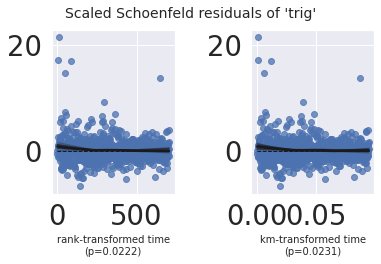

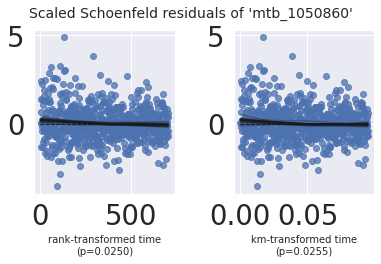

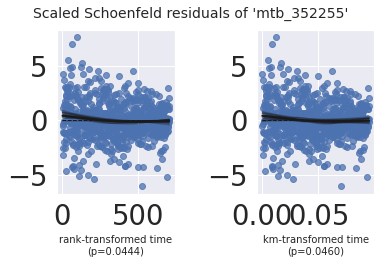

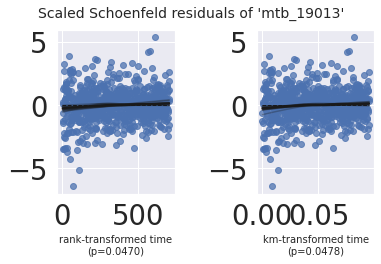

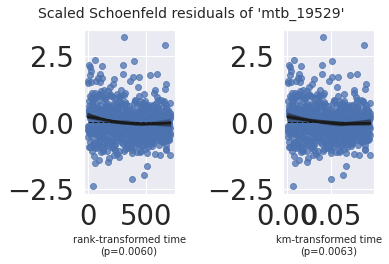

...

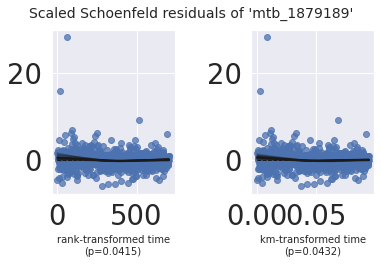

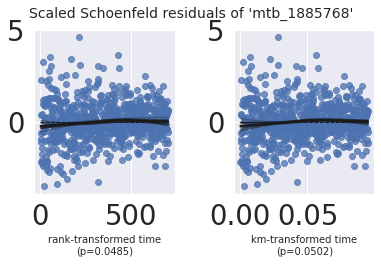

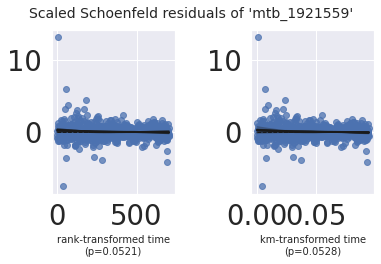

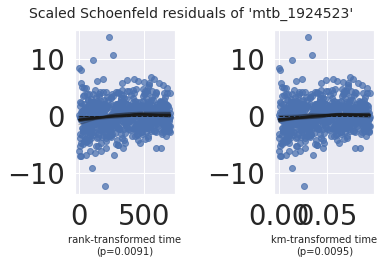

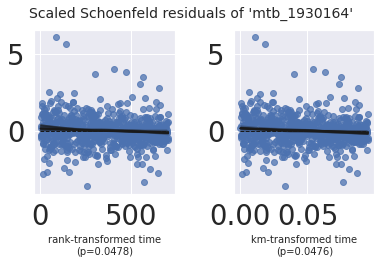

In [ ]:
cph.check_assumptions(df7, p_value_threshold = 0.05, show_plots= True)

In [ ]:
cph.print_summary()

<lifelines.CoxPHFitter: fitted with 7697 total observations, 6993 right-censored observations>
             duration col = 'diabetes_time'
                event col = 'incident_diabetes'
      baseline estimation = breslow
   number of observations = 7697
number of events observed = 704
   partial log-likelihood = -5308.61
         time fit was run = 2022-01-10 07:56:52 UTC

---
               coef  exp(coef)   se(coef)   coef lower 95%   coef upper 95%  exp(coef) lower 95%  exp(coef) upper 95%
covariate                                                                                                            
SampleID       0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
age            0.00       1.00       0.01            -0.01             0.02                 0.99                 1.02
male           0.02       1.02       0.20            -0.38             0.42                 0.68                 1.52
HDL           -0.09       0.91       0.20            -0.48             0.29                 0.62                 1.34
trig           0.10       1.10       0.08            -0.06             0.26                 0.94                 1.29
hypertension   0.44       1.55       0.12             0.21             0.66                 1.23                 1.94
ex_smoker      0.01       1.01       0.12            -0.23             0.24                 0.79                 1.27
mtb_1368087   -0.05       0.95       0.09            -0.22             0.13                 0.80                 1.14
mtb_1380093   -0.04       0.96       0.09            -0.21             0.13                 0.81                 1.13
mtb_1812369   -0.00       1.00       0.12            -0.24             0.24                 0.79                 1.27
mtb_1042362    0.04       1.04       0.06            -0.09             0.16                 0.92                 1.18
mtb_1091716   -0.02       0.98       0.06            -0.14             0.10                 0.87                 1.11
mtb_1228672    0.04       1.04       0.11            -0.18             0.25                 0.83                 1.29
mtb_1542487   -0.01       0.99       0.07            -0.15             0.12                 0.86                 1.13
mtb_1272352    0.01       1.01       0.09            -0.16             0.18                 0.85                 1.20
mtb_1391826    0.04       1.04       0.07            -0.10             0.18                 0.91                 1.20
mtb_1435571   -0.01       0.99       0.08            -0.18             0.15                 0.84                 1.17
mtb_1521753    0.01       1.01       0.07            -0.13             0.14                 0.88                 1.15
mtb_1834574    0.07       1.07       0.15            -0.23             0.36                 0.79                 1.44
mtb_1050860    0.00       1.00       0.03            -0.06             0.07                 0.94                 1.08
mtb_606773     0.01       1.01       0.08            -0.15             0.16                 0.86                 1.18
mtb_638620    -0.04       0.96       0.13            -0.29             0.21                 0.75                 1.23
mtb_752773     0.01       1.01       0.08            -0.15             0.18                 0.86                 1.19
mtb_590255    -0.02       0.98       0.07            -0.16             0.11                 0.85                 1.12
mtb_709794     0.00       1.00       0.08            -0.15             0.16                 0.86                 1.17
mtb_352255     0.00       1.00       0.07            -0.13             0.14                 0.88                 1.15
mtb_509192    -0.01       0.99       0.05            -0.11             0.09                 0.90                 1.09
mtb_1230298    0.01       1.01       0.08            -0.16             0.18                 0.86                 1.19
mtb_841524     0.01       1.01       0.10            -0.19             0.21   

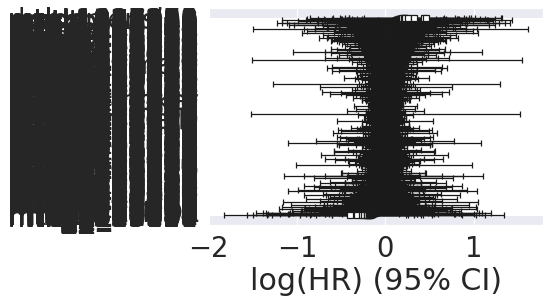

In [ ]:
cph.plot()

**Question 2: How can we use blood biomarkers alone to predict the risk of developing diabetes?**

In [ ]:
X3.head()

,mtb_1596386,mtb_1215338,male,age,mtb_1833492,hypertension,diabetes_time
1,-0.079220,1.115133,-0.938548,1.629025,0.083779,-0.564460,0.368181
2,-0.132246,1.539416,1.065337,1.857375,-0.087391,1.771374,0.368181
3,-0.378886,-1.106872,-0.938548,1.552909,-0.064119,-0.564460,-3.931262
4,-0.665955,-0.039556,-0.938548,0.943976,-0.094857,-0.564460,0.368181
5,-0.649081,1.328366,1.065337,-1.720104,-0.041543,-0.564460,0.368181


In [ ]:
#Dropping the Clinical features
X4=X3.iloc[:,[0,1,4]]

In [ ]:
X4.head()

,mtb_1596386,mtb_1215338,mtb_1833492
1,-0.079220,1.115133,0.083779
2,-0.132246,1.539416,-0.087391
3,-0.378886,-1.106872,-0.064119
4,-0.665955,-0.039556,-0.094857
5,-0.649081,1.328366,-0.041543


I splitted the data into a training and test set. I’ve chosen a 70/30 split.

In [ ]:
# separate dataset into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    X4,
    y,
    test_size=0.3,
    random_state=0)

y_train.shape, X_test.shape

((5387,), (2310, 3))

In [ ]:
def run_exps(X_train, y_train , X_test, y_test):

  dfs = []
  models = [('LogReg', LogisticRegression()), ('RF', RandomForestClassifier()), ('KNN', KNeighborsClassifier()),
            ('SVM', SVC()), ('GNB', GaussianNB()),('XGB', XGBClassifier())]
  

  results = []
  names = []
  scoring = ['accuracy', 'precision_weighted', 'recall_weighted', 'f1_weighted', 'roc_auc']
  target_names = ['incident_diabetes']
  for name, model in models:

    kfold = model_selection.KFold(n_splits=5, shuffle=True, random_state=90210)
    cv_results = model_selection.cross_validate(model, X_train, y_train, cv=kfold, scoring=scoring)
    clf = model.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    print(name)
    print(classification_report(y_test, y_pred))
    results.append(cv_results)
    names.append(name)
    this_df = pd.DataFrame(cv_results)
    this_df['model'] = name
    dfs.append(this_df)
    final = pd.concat(dfs, ignore_index=True)
  return final

In [ ]:
run_exps(X_train , y_train, X_test, y_test)

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/pytho

LogReg
              precision    recall  f1-score   support

         0.0       0.90      1.00      0.95      2087
         1.0       0.00      0.00      0.00       223

    accuracy                           0.90      2310
   macro avg       0.45      0.50      0.47      2310
weighted avg       0.82      0.90      0.86      2310



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



RF
              precision    recall  f1-score   support

         0.0       0.90      1.00      0.95      2087
         1.0       0.33      0.00      0.01       223

    accuracy                           0.90      2310
   macro avg       0.62      0.50      0.48      2310
weighted avg       0.85      0.90      0.86      2310

KNN
              precision    recall  f1-score   support

         0.0       0.90      1.00      0.95      2087
         1.0       0.20      0.01      0.02       223

    accuracy                           0.90      2310
   macro avg       0.55      0.50      0.48      2310
weighted avg       0.84      0.90      0.86      2310



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/pytho

SVM
              precision    recall  f1-score   support

         0.0       0.90      1.00      0.95      2087
         1.0       0.00      0.00      0.00       223

    accuracy                           0.90      2310
   macro avg       0.45      0.50      0.47      2310
weighted avg       0.82      0.90      0.86      2310

GNB
              precision    recall  f1-score   support

         0.0       0.90      1.00      0.95      2087
         1.0       0.00      0.00      0.00       223

    accuracy                           0.90      2310
   macro avg       0.45      0.50      0.47      2310
weighted avg       0.82      0.90      0.86      2310



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to contr

XGB
              precision    recall  f1-score   support

         0.0       0.90      1.00      0.95      2087
         1.0       0.00      0.00      0.00       223

    accuracy                           0.90      2310
   macro avg       0.45      0.50      0.47      2310
weighted avg       0.82      0.90      0.86      2310



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



,fit_time,score_time,test_accuracy,test_precision_weighted,test_recall_weighted,test_f1_weighted,test_roc_auc,model
0,0.021560,0.015301,0.915584,0.838295,0.915584,0.875237,0.634768,LogReg
1,0.014785,0.014620,0.888683,0.789757,0.888683,0.836305,0.548565,LogReg
2,0.015998,0.014955,0.916435,0.839852,0.916435,0.876474,0.562344,LogReg
3,0.015740,0.014759,0.923863,0.853522,0.923863,0.887300,0.547310,LogReg
4,0.014547,0.014881,0.909006,0.826293,0.909006,0.865678,0.515436,LogReg
5,0.773680,0.079330,0.913729,0.838151,0.913729,0.874310,0.512358,RF
6,0.689235,0.070561,0.888683,0.789757,0.888683,0.836305,0.509260,RF
7,0.711726,0.074852,0.916435,0.839852,0.916435,0.876474,0.489632,RF
8,0.694024,0.071633,0.922006,0.853391,0.922006,0.886373,0.501508,RF
9,0.675525,0.069238,0.906221,0.826062,0.906221,0.864287,0.543761,RF


In [ ]:
y_train.value_counts()

0.0    4906
1.0     481
Name: incident_diabetes, dtype: int64

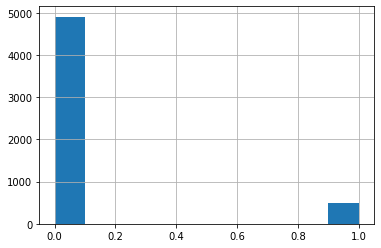

In [ ]:
y_train.hist()

Applied SMOTE and rearranged the data to improve accuracy
As you can see, the data in each class is imbalanced, an oversampling of data would probably help us in resolving the issue of imbalancing.


In [ ]:
from imblearn.over_sampling import SMOTE
sm = SMOTE()
X_train, y_train = sm.fit_resample(X_train,y_train)
X_train.shape, y_train.shape

((9812, 3), (9812,))

In [ ]:
y_train.value_counts()

1.0    4906
0.0    4906
Name: incident_diabetes, dtype: int64

We are going to quickly test the fit of 6 different models on this dataset. 

I have chosen to test:

Logistic Regression: basic linear classifier (good to baseline)

Random Forest: ensemble bagging classifier

K-Nearest Neighbors: instance based classifier

Support Vector Machines: maximum margin classifier

Gaussian Naive Bayes: probabilistic classifier

XGBoost: ensemble (extreme!) boosting classifier

To run the initial experiments, I used the default parameters for each model. To get a more accurate representation of the fit for each of these models, the default parameters would need to be adjusted; however, for the purposes of this article, the general idea is made more clear by not tweaking each model.

In [ ]:
def run_exps(X_train, y_train , X_test, y_test):

  dfs = []
  models = [('LogReg', LogisticRegression()), ('RF', RandomForestClassifier()), ('KNN', KNeighborsClassifier()),
            ('SVM', SVC()), ('GNB', GaussianNB()),('XGB', XGBClassifier())]
  

  results = []
  names = []
  scoring = ['accuracy', 'precision_weighted', 'recall_weighted', 'f1_weighted', 'roc_auc']
  target_names = ['incident_diabetes']
  for name, model in models:

    kfold = model_selection.KFold(n_splits=5, shuffle=True, random_state=90210)
    cv_results = model_selection.cross_validate(model, X_train, y_train, cv=kfold, scoring=scoring)
    clf = model.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    print(name)
    print(classification_report(y_test, y_pred))
    results.append(cv_results)
    names.append(name)
    this_df = pd.DataFrame(cv_results)
    this_df['model'] = name
    dfs.append(this_df)
    final = pd.concat(dfs, ignore_index=True)
  return final

In [ ]:
run_exps(X_train , y_train, X_test, y_test)

LogReg
              precision    recall  f1-score   support

         0.0       0.93      0.52      0.66      2087
         1.0       0.12      0.62      0.20       223

    accuracy                           0.53      2310
   macro avg       0.52      0.57      0.43      2310
weighted avg       0.85      0.53      0.62      2310

RF
              precision    recall  f1-score   support

         0.0       0.91      0.83      0.87      2087
         1.0       0.12      0.22      0.16       223

    accuracy                           0.77      2310
   macro avg       0.52      0.53      0.51      2310
weighted avg       0.83      0.77      0.80      2310

KNN
              precision    recall  f1-score   support

         0.0       0.91      0.68      0.78      2087
         1.0       0.11      0.37      0.17       223

    accuracy                           0.65      2310
   macro avg       0.51      0.52      0.47      2310
weighted avg       0.83      0.65      0.72      2310

SVM
 

,fit_time,score_time,test_accuracy,test_precision_weighted,test_recall_weighted,test_f1_weighted,test_roc_auc,model
0,0.023885,0.018232,0.532858,0.534211,0.532858,0.531760,0.563182,LogReg
1,0.021262,0.018141,0.548650,0.550905,0.548650,0.547046,0.576672,LogReg
2,0.020350,0.018140,0.558104,0.557499,0.558104,0.557481,0.577592,LogReg
3,0.028121,0.017695,0.543323,0.544475,0.543323,0.540781,0.556435,LogReg
4,0.020362,0.016654,0.565240,0.565883,0.565240,0.563742,0.585802,LogReg
5,1.267770,0.120142,0.818645,0.819702,0.818645,0.818598,0.901086,RF
6,1.216357,0.121147,0.809985,0.811691,0.809985,0.809892,0.891729,RF
7,1.233107,0.131222,0.823649,0.824299,0.823649,0.823346,0.904248,RF
8,1.217643,0.121708,0.820082,0.820086,0.820082,0.820082,0.899169,RF
9,1.206151,0.122770,0.820082,0.820846,0.820082,0.819951,0.901462,RF


In [ ]:
final = run_exps(X_train, y_train , X_test, y_test)

LogReg
              precision    recall  f1-score   support

         0.0       0.93      0.52      0.66      2087
         1.0       0.12      0.62      0.20       223

    accuracy                           0.53      2310
   macro avg       0.52      0.57      0.43      2310
weighted avg       0.85      0.53      0.62      2310

RF
              precision    recall  f1-score   support

         0.0       0.91      0.83      0.87      2087
         1.0       0.12      0.22      0.15       223

    accuracy                           0.77      2310
   macro avg       0.51      0.52      0.51      2310
weighted avg       0.83      0.77      0.80      2310

KNN
              precision    recall  f1-score   support

         0.0       0.91      0.68      0.78      2087
         1.0       0.11      0.37      0.17       223

    accuracy                           0.65      2310
   macro avg       0.51      0.52      0.47      2310
weighted avg       0.83      0.65      0.72      2310

SVM
 

Evaluate the Results

To wrap up our analysis, we are going to analyze the data in the final dataframe returned from the run_exps() script.
To obtain better estimates of the distribution of metrics from each model, I run empirical bootstrapping at 30 samples. Additionally, I partition the data into two sorts: performance metrics and fit-time metrics. The following block of code achieves this.

In [ ]:
bootstraps = []
for model in list(set(final.model.values)):
  model_df = final.loc[final.model == model]
  bootstrap = model_df.sample(n=30, replace=True)
  bootstraps.append(bootstrap)
        
bootstrap_df = pd.concat(bootstraps, ignore_index=True)
results_long = pd.melt(bootstrap_df,id_vars=['model'],var_name='metrics', value_name='values')
time_metrics = ['fit_time','score_time'] # fit time metrics
## PERFORMANCE METRICS
results_long_nofit = results_long.loc[~results_long['metrics'].isin(time_metrics)] # get df without fit data
results_long_nofit = results_long_nofit.sort_values(by='values')
## TIME METRICS
results_long_fit = results_long.loc[results_long['metrics'].isin(time_metrics)] # df with fit data
results_long_fit = results_long_fit.sort_values(by='values')

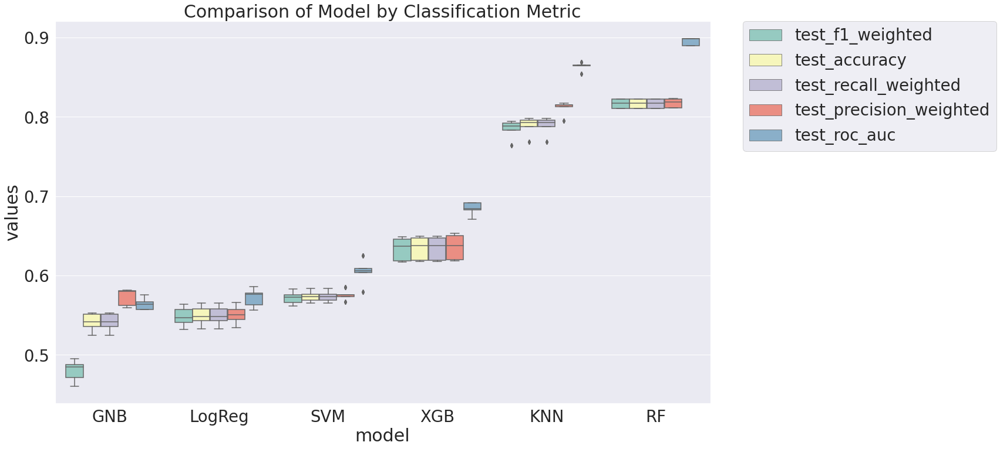

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(20, 12))
sns.set(font_scale=2.5)
g = sns.boxplot(x="model", y="values", hue="metrics", data=results_long_nofit, palette="Set3")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('Comparison of Model by Classification Metric')
plt.savefig('./benchmark_models_performance.png',dpi=300)

Question 3: Are there any clusters based on blood biomarkers among the participantswho developed incident diabetes? Can you identify which blood biomarkers defined theseclusters?

In [ ]:
import copy
df = copy.deepcopy(X2)
df = df.drop(columns=['male', 'age', 'hypertension', 'diabetes_time','SampleID', 'HDL', 'trig', 'ex_smoker'])
df.head()
df.columns

Index(['mtb_1368087', 'mtb_1380093', 'mtb_1812369', 'mtb_1042362',
       'mtb_1091716', 'mtb_1228672', 'mtb_1542487', 'mtb_1272352',
       'mtb_1391826', 'mtb_1435571',
       ...
       'mtb_1933753', 'mtb_1933760', 'mtb_1936126', 'mtb_1936261',
       'mtb_1945649', 'mtb_1955392', 'mtb_1958012', 'mtb_1965438',
       'mtb_1965524', 'mtb_1973875'],
      dtype='object', length=1435)

In [ ]:
df = df.loc[data["incident_diabetes"] == 1.0]
df.shape

(704, 1435)

Standardization scales, or shifts, the values for each numerical feature in your dataset so that the features have a mean of 0 and standard deviation of 1


In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(df)
scaler.transform(df)

array([[ 0.97639985, -0.01466345, -0.27661654, ..., -1.07388282,
        -0.90155969, -0.56540584],
       [ 1.39341145,  1.2457782 ,  0.97156521, ...,  0.62614389,
        -0.60419645,  0.97447361],
       [ 0.3930338 , -0.53029666, -1.14972596, ..., -0.90758205,
        -0.44345712, -0.20140467],
       ...,
       [ 0.19377348, -0.30584562, -0.31013029, ..., -0.24894006,
         0.12404779, -0.40447624],
       [-0.13147235, -0.63905144, -0.05299164, ..., -0.37882138,
         1.02100202,  0.36475442],
       [ 0.13102797, -0.14023021, -0.35537224, ...,  0.97774191,
         0.67712944,  0.94238942]])

In [ ]:
!pip install kneed 
import matplotlib.pyplot as plt
from kneed import KneeLocator
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

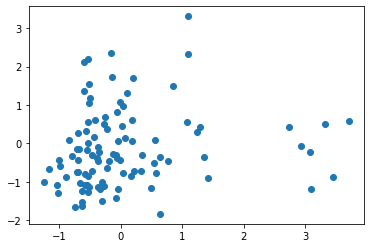

In [ ]:
plt.scatter(df['mtb_1596386'][1:100],df['mtb_1215338'][1:100])

In [ ]:
scaler = StandardScaler()
scaled_features = scaler.fit_transform(df)

In [ ]:
kmeans_kwargs = {
 "init": "random",
 "n_init": 10,
  "max_iter": 300,
  "random_state": 42,
 }

In [ ]:
# A list holds the SSE values for each k
sse = []
for k in range(1, 21):
  kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
  kmeans.fit(scaled_features)
  sse.append(kmeans.inertia_)

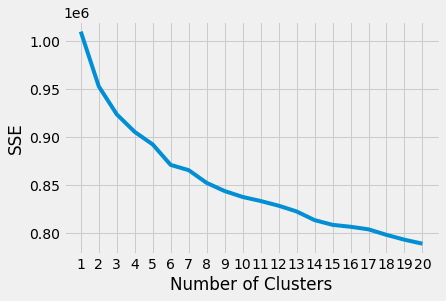

In [ ]:
plt.style.use("fivethirtyeight")
plt.plot(range(1, 21), sse)
plt.xticks(range(1, 21))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In [ ]:
kl = KneeLocator(
    range(1, 21), sse, curve="convex", direction="decreasing"
)

kl.elbow

8

In [ ]:
kmeans = KMeans(n_clusters=8, **kmeans_kwargs)
kmeans.fit(df)
clusters=kmeans.predict(df)


In [ ]:
scalar = StandardScaler()
df = scalar.fit_transform(df)
df= pd.DataFrame(df)
print(df)

In [ ]:
kmeans = KMeans(n_clusters=8).fit(df)
kmeans.labels_


array([4, 1, 5, 4, 5, 5, 1, 2, 1, 0, 5, 4, 2, 1, 1, 4, 5, 0, 1, 1, 5, 2,
       2, 2, 4, 3, 5, 2, 1, 1, 4, 4, 1, 4, 5, 7, 2, 0, 2, 5, 2, 0, 0, 0,
       1, 1, 1, 4, 4, 2, 0, 4, 4, 1, 4, 1, 1, 6, 3, 4, 1, 2, 2, 4, 4, 4,
       5, 4, 1, 1, 4, 1, 1, 1, 4, 0, 1, 2, 2, 1, 2, 1, 2, 1, 4, 1, 4, 2,
       4, 3, 2, 4, 1, 1, 1, 0, 4, 0, 0, 2, 0, 2, 1, 0, 2, 2, 4, 0, 1, 4,
       0, 1, 4, 4, 1, 2, 0, 1, 5, 2, 0, 1, 0, 5, 0, 0, 4, 1, 4, 5, 1, 1,
       1, 0, 1, 5, 0, 1, 5, 1, 2, 1, 4, 0, 2, 0, 5, 5, 4, 1, 2, 1, 1, 5,
       2, 1, 1, 4, 0, 4, 2, 2, 1, 4, 2, 5, 1, 0, 1, 4, 1, 5, 1, 0, 1, 4,
       2, 2, 5, 2, 5, 4, 1, 1, 2, 1, 5, 4, 5, 4, 1, 1, 4, 1, 2, 2, 0, 5,
       5, 5, 4, 4, 1, 4, 1, 0, 0, 4, 0, 4, 1, 4, 0, 3, 0, 2, 1, 0, 1, 4,
       1, 3, 2, 4, 1, 2, 1, 2, 5, 0, 5, 1, 1, 3, 1, 4, 2, 0, 4, 3, 2, 2,
       4, 4, 1, 1, 1, 4, 0, 3, 4, 2, 1, 1, 1, 4, 1, 1, 4, 4, 0, 2, 0, 1,
       5, 0, 5, 4, 5, 5, 1, 1, 4, 5, 1, 5, 4, 0, 1, 1, 2, 0, 1, 5, 1, 2,
       0, 0, 0, 0, 1, 2, 2, 2, 1, 2, 2, 2, 7, 4, 4,

In [ ]:
memb =  pd.Series(kmeans.labels_, index=df.index)


Centroid Analysis

 Identified top blood biomarkers that contributed to the clustering.

In [ ]:
clusters = ['Cluster {}'.format(i) for i in range(8)]
Centroids_orig = pd.DataFrame(0.0, index = clusters,
                        columns = df.columns)

Centroids_std = pd.DataFrame(0.0, index =  clusters,
                        columns = df.columns)
for i in range(4):
    BM = memb==i
    Centroids_orig.iloc[i] = df[BM].median(axis=0)
    Centroids_std.iloc[i] = df[BM].mean(axis=0)
    
Centroids_orig

,mtb_1368087,mtb_1380093,mtb_1812369,mtb_1042362,mtb_1091716,mtb_1228672,mtb_1542487,mtb_1272352,mtb_1391826,mtb_1435571,mtb_1521753,mtb_1834574,mtb_1050860,mtb_606773,mtb_638620,mtb_752773,mtb_590255,mtb_709794,mtb_352255,mtb_509192,mtb_1230298,mtb_841524,mtb_1957718,mtb_18385,mtb_18386,mtb_18440,mtb_18712,mtb_18911,mtb_19013,mtb_19108,mtb_19128,mtb_19173,mtb_19198,mtb_19397,mtb_19438,mtb_19495,mtb_19503,mtb_19529,mtb_19532,mtb_19556,...,mtb_1885302,mtb_1885768,mtb_1886262,mtb_1888862,mtb_1888919,mtb_1890558,mtb_1890752,mtb_1895320,mtb_1897069,mtb_1898223,mtb_1900047,mtb_1901939,mtb_1902527,mtb_1908191,mtb_1911986,mtb_1913620,mtb_1913630,mtb_1914931,mtb_1915009,mtb_1916062,mtb_1916768,mtb_1916814,mtb_1916826,mtb_1919790,mtb_1919959,mtb_1921559,mtb_1924325,mtb_1924466,mtb_1924523,mtb_1930164,mtb_1933753,mtb_1933760,mtb_1936126,mtb_1936261,mtb_1945649,mtb_1955392,mtb_1958012,mtb_1965438,mtb_1965524,mtb_1973875
Cluster 0,-0.012929,-0.155997,-0.361530,-0.274328,-0.024015,-0.116084,-0.170370,-0.158015,0.073748,-0.114101,-0.185393,-0.267630,-0.199674,0.057757,-0.145920,0.120566,0.010356,-0.085555,0.020734,-0.094101,-0.019929,-0.064856,-0.221876,-0.165121,-0.340379,0.003133,-0.228245,-0.155375,-0.103334,-0.163463,-0.220692,-0.202804,-0.261208,-0.221368,-0.103263,-0.159029,-0.029596,-0.125010,-0.120175,-0.104069,...,0.953719,0.408723,-0.470415,-0.308987,0.000995,-0.638670,0.658234,0.327063,0.625764,-0.226872,-0.061184,0.307222,0.429450,-0.411220,0.763912,-0.046527,0.803873,0.229429,0.582161,0.415967,-0.374267,-0.287856,-0.377539,-0.587862,-0.397089,0.226420,-0.456597,-0.451925,-0.266882,-0.167444,0.553780,0.244970,1.016725,0.743934,0.236318,0.665882,-0.378732,-0.120315,0.239441,0.354522
Cluster 1,0.647035,0.535400,0.077405,-0.027963,0.107900,0.391670,0.153080,0.315450,0.440794,0.502338,0.226226,-0.068185,0.022731,0.066937,0.174627,0.195473,0.073291,0.209628,0.132709,-0.018609,0.293902,0.181353,-0.077398,0.000131,-0.248325,-0.064403,-0.049779,-0.121305,-0.058733,-0.171338,-0.118618,0.012954,-0.080383,-0.121590,-0.011494,-0.149861,-0.026914,-0.093913,-0.077781,-0.000665,...,-0.524209,-0.151366,0.050645,-0.715163,-0.429376,-0.362230,-0.525250,-0.376735,-0.622140,-0.277229,-0.385947,-0.403897,-0.396703,-0.241790,-0.595725,-0.071702,-0.507861,-0.391481,-0.446244,-0.471203,-0.064699,-0.109307,-0.051920,-0.097294,-0.060410,-0.490842,-0.109313,-0.101150,-0.116029,-0.393401,-0.516674,-0.536836,-0.512510,-0.451772,-0.372469,-0.518335,-0.302382,-0.335374,-0.301800,-0.422280
Cluster 2,-0.196389,-0.129734,-0.608029,-0.172746,-0.423750,0.040724,0.201883,-0.358122,-0.421521,0.048203,-0.318645,-0.745297,-0.173696,-0.335843,0.346410,0.036531,-0.287074,-0.078205,-0.624492,-0.274629,-0.232581,-0.293458,-0.338917,-0.209250,0.074123,0.236729,-0.015491,0.018658,0.149588,0.134917,-0.143283,-0.020626,0.395809,-0.022165,0.048600,-0.155438,-0.034856,-0.141175,-0.061253,-0.073293,...,-0.350093,-0.061957,-0.150806,-0.221295,-0.125001,-0.053924,-0.399900,-0.308930,-0.321636,-0.075466,-0.192424,-0.352726,-0.085851,-0.230100,-0.444954,-0.249548,-0.396203,-0.381290,-0.318012,-0.250045,0.117578,0.521494,0.516994,0.261549,0.573123,-0.421855,0.102825,0.152470,0.523806,-0.152951,-0.381187,-0.359904,-0.415448,-0.435592,-0.304751,-0.413798,-0.263428,-0.273323,-0.392567,-0.369067
Cluster 3,-0.553939,-1.143777,-0.795287,-0.421586,-0.592179,-0.072016,-0.112388,-1.168885,-0.411191,-1.319881,-1.016477,-0.515427,-0.592882,-0.752355,-0.405605,-0.524323,-0.925372,-0.864947,-0.555951,-0.637947,-0.331745,-0.384272,-1.218017,-0.300486,0.262713,0.388521,0.067294,0.349890,0.229893,0.576631,0.194068,0.107726,0.631331,0.194040,0.503760,0.059692,-0.023543,0.131717,0.068816,-0.130262,...,-0.503715,0.449845,-0.110247,-0.035286,-0.051631,0.233861,-0.280629,-0.113029,-0.305888,0.024068,-0.362986,-0.331813,-0.388081,0.474381,-0.390117,-0.403021,-0.388312,-0.388496,-0.406164,-0.416483,0.016104,0.172810,0.586526,0.136156,0.675542,-0.451875,0.147117,0.304504,0.240991,0.015141,-0.336862,-0.44069

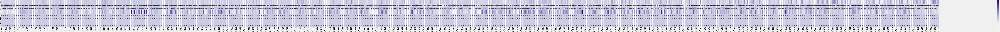

In [ ]:

plt.figure(figsize=(400,50))
import seaborn as sns
sns.heatmap(Centroids_std, linewidths=.5, annot=True, 
                    cmap='Purples')
plt.show()

In [ ]:
Centroids_std.idxmax(axis=1)

Cluster 0    mtb_1831461
Cluster 1    mtb_1403851
Cluster 2    mtb_1355923
Cluster 3    mtb_1529602
Cluster 4    mtb_1368087
Cluster 5    mtb_1368087
Cluster 6    mtb_1368087
Cluster 7    mtb_1368087
dtype: object

Top blood biomarkers for :
*   Cluster 0   is  mtb_1831461
*   Cluster 1   is  mtb_1403851
*   Cluster 2   is  mtb_1355923
*   Cluster 3   is  mtb_1529602
*   Cluster 4   is  mtb_1368087
*   Cluster 5   is  mtb_1368087
*   Cluster 6   is  mtb_1368087
*   Cluster 7   is  mtb_1368087












